In [1]:
import tensorflow as tf
import os, subprocess, re
import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
import shutil
import json
from google.protobuf import text_format
import pprint
import random
from pathlib import Path
from google.protobuf import text_format

%matplotlib inline

d:\Conda\envs\gpu\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
from object_detection.utils import dataset_util, label_map_util
#from object_detection.dataset_tools.create_coco_tf_record import create_tf_example
from object_detection.protos import string_int_label_map_pb2
from object_detection.protos import pipeline_pb2
from object_detection.utils import visualization_utils as vis_util

In [16]:
MODEL = 'ssd_mobilenet_v2_coco_2018_03_29'
DATA_DIR = 'nn_models'
MODEL_DIR = os.path.join(DATA_DIR, MODEL)
URL = 'http://download.tensorflow.org/models/object_detection/%s.tar.gz' % MODEL
DOWNLOAD_PATH = '%s/%s.tar.gz' % (DATA_DIR, MODEL)

In [3]:
from tensorflow.python.util import compat
from tensorflow.core.protobuf import saved_model_pb2

def reconstruct(pb_path):
    if not os.path.isfile(pb_path):
        print("Error: %s not found" % pb_path)

    print("Reconstructing Tensorflow model")
    detection_graph = tf.Graph()
    with detection_graph.as_default():
        od_graph_def = tf.compat.v1.GraphDef()
        with tf.io.gfile.GFile(pb_path, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
    print("Success!")
    return detection_graph

In [46]:
def image2np(image):
    (w, h) = image.size
    return np.array(image.getdata()).reshape((h, w, 3)).astype(np.uint8)

def image2tensor(image):
    npim = image2np(image)
    return np.expand_dims(npim, axis=0)

%matplotlib inline
def detect(detection_graph, test_image_path):
    with detection_graph.as_default():
        gpu_options = tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.01)#per_process_gpu_memory_fraction=0.01
        with tf.compat.v1.Session(graph=detection_graph,config=tf.compat.v1.ConfigProto(gpu_options=gpu_options)) as sess:
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
            detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')

            image = Image.open(test_image_path)
            (boxes, scores, classes, num) = sess.run(
                [detection_boxes, detection_scores, detection_classes, num_detections],
                feed_dict={image_tensor: image2tensor(image)}
            )

            npim = image2np(image)
            vis_util.visualize_boxes_and_labels_on_image_array(
                npim,
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                line_thickness=15)
            plt.figure(figsize=(12, 8))
            plt.imshow(npim)
            plt.show()

In [27]:
#PB_PATH = "nn-models/ssd_mobilenet_v2_coco_2018_03_29/frozen_inference_graph.pb"
PB_PATH = "model/ssd_mobilenet_v2_taco_2018_03_29.pb"
#PB_PATH = "nn-models/garbagedetection/ssd_mobilenet_v2/frozen_inference_graph.pb"
LABEL_PATH = 'data/graph.pbtxt'
NCLASSES = 60

In [28]:
detection_graph = reconstruct(PB_PATH)

Reconstructing Tensorflow model
Success!


In [82]:
if not os.path.exists(LABEL_PATH):
    print('Building label map from examples')

    from object_detection.protos import string_int_label_map_pb2
    from google.protobuf import text_format

    labelmap = string_int_label_map_pb2.StringIntLabelMap()
    for category in categories:
        item = labelmap.item.add()
        # label map id 0 is reserved for the background label
        item.id = int(category['id'])+1
        item.name = category['name']

    with open(LABEL_PATH, 'w') as f:
        f.write(text_format.MessageToString(labelmap))

    print('Label map witten to labelmap.pbtxt')
else:
    print('Reusing existing labelmap.pbtxt')

Reusing existing labelmap.pbtxt


In [10]:
label_map = label_map_util.load_labelmap('data/labelmap.pbtxt')
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NCLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [11]:
category_index

{1: {'id': 1, 'name': 'Aluminium foil'},
 2: {'id': 2, 'name': 'Battery'},
 3: {'id': 3, 'name': 'Aluminium blister pack'},
 4: {'id': 4, 'name': 'Carded blister pack'},
 5: {'id': 5, 'name': 'Other plastic bottle'},
 6: {'id': 6, 'name': 'Clear plastic bottle'},
 7: {'id': 7, 'name': 'Glass bottle'},
 8: {'id': 8, 'name': 'Plastic bottle cap'},
 9: {'id': 9, 'name': 'Metal bottle cap'},
 10: {'id': 10, 'name': 'Broken glass'},
 11: {'id': 11, 'name': 'Food Can'},
 12: {'id': 12, 'name': 'Aerosol'},
 13: {'id': 13, 'name': 'Drink can'},
 14: {'id': 14, 'name': 'Toilet tube'},
 15: {'id': 15, 'name': 'Other carton'},
 16: {'id': 16, 'name': 'Egg carton'},
 17: {'id': 17, 'name': 'Drink carton'},
 18: {'id': 18, 'name': 'Corrugated carton'},
 19: {'id': 19, 'name': 'Meal carton'},
 20: {'id': 20, 'name': 'Pizza box'},
 21: {'id': 21, 'name': 'Paper cup'},
 22: {'id': 22, 'name': 'Disposable plastic cup'},
 23: {'id': 23, 'name': 'Foam cup'},
 24: {'id': 24, 'name': 'Glass cup'},
 25: {'i

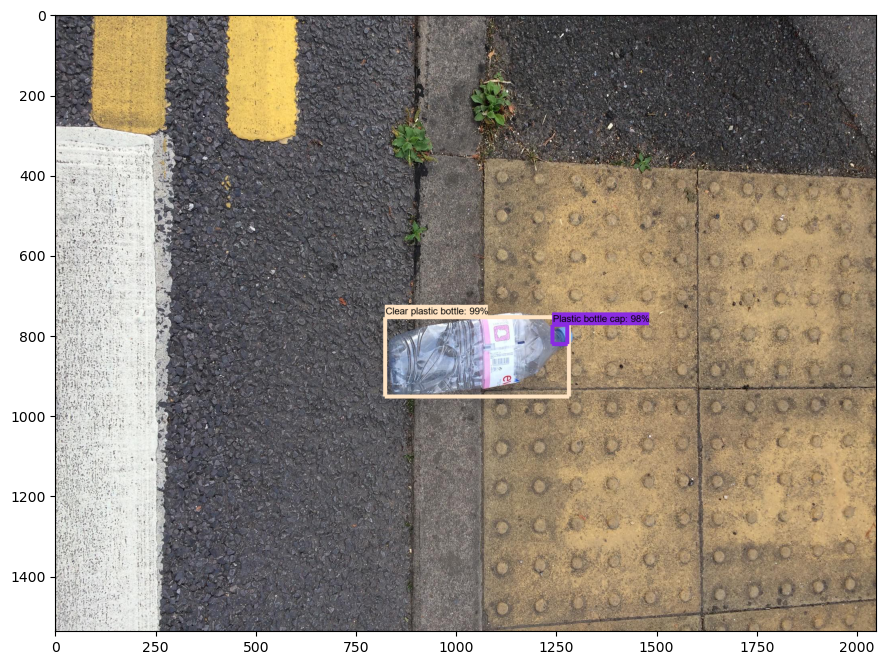

In [33]:
detect(detection_graph, 'taco/data/batch_1/000001.jpg')

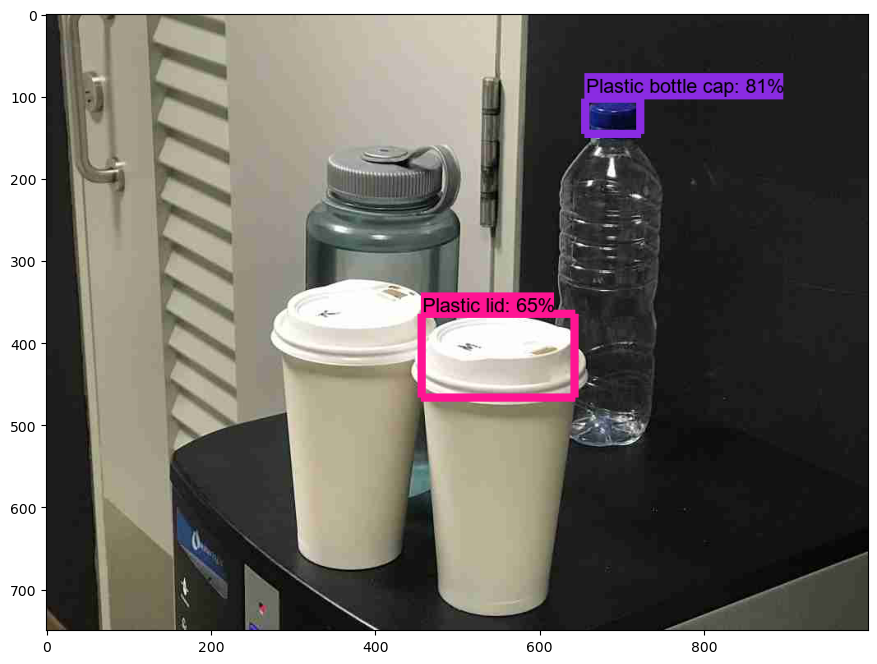

In [35]:
detect(detection_graph, '2.jpg')

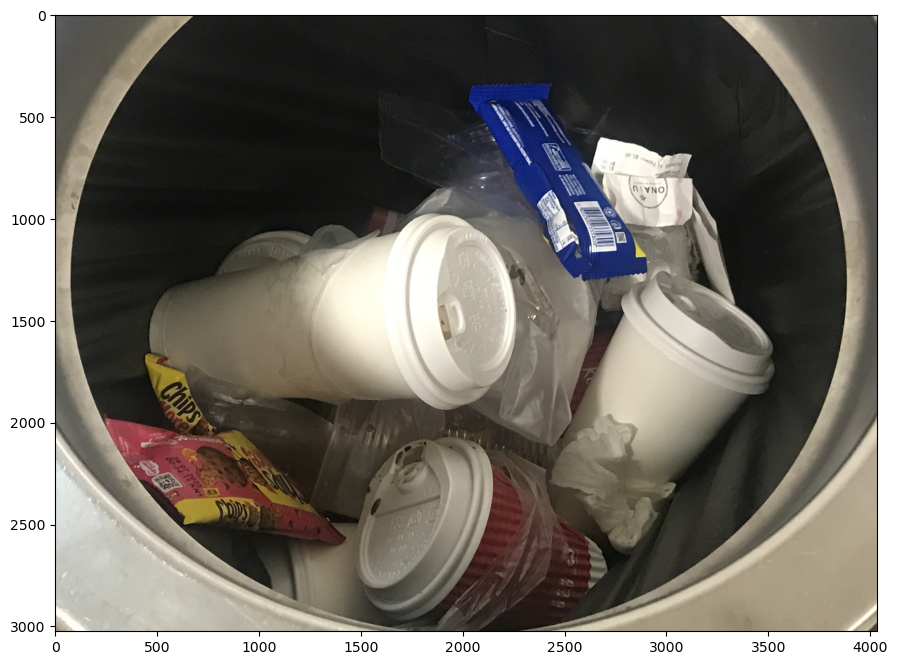

In [36]:
detect(detection_graph, 'smu.jpg')

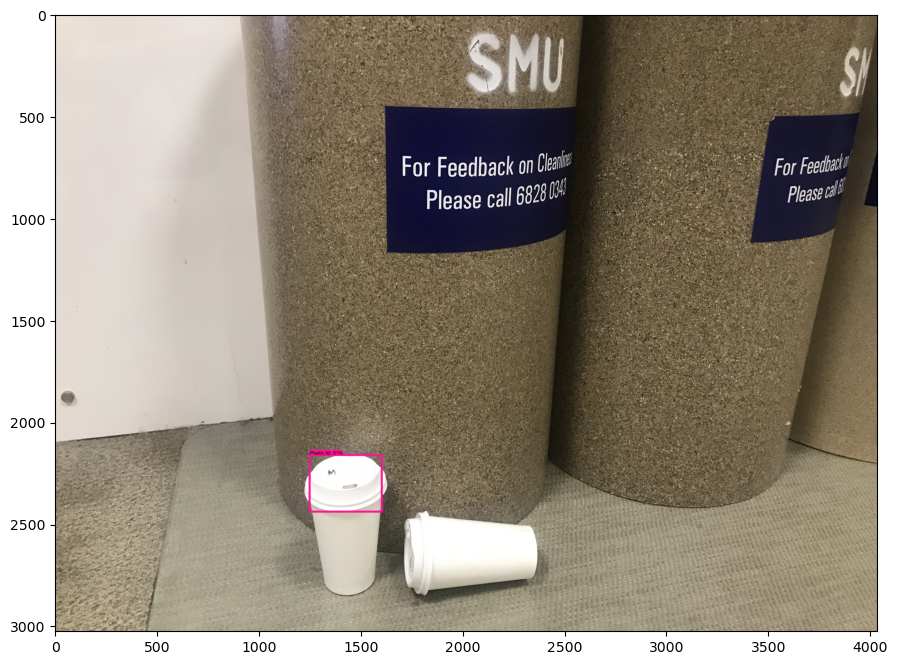

In [37]:
detect(detection_graph, 'smu2.jpg')

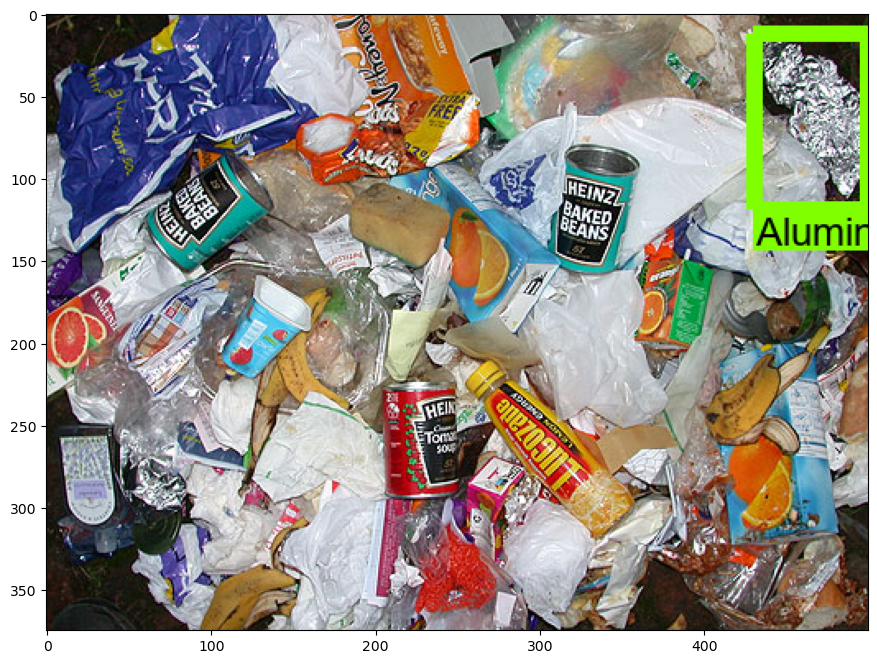

In [38]:
detect(detection_graph, 'trash.jpg')

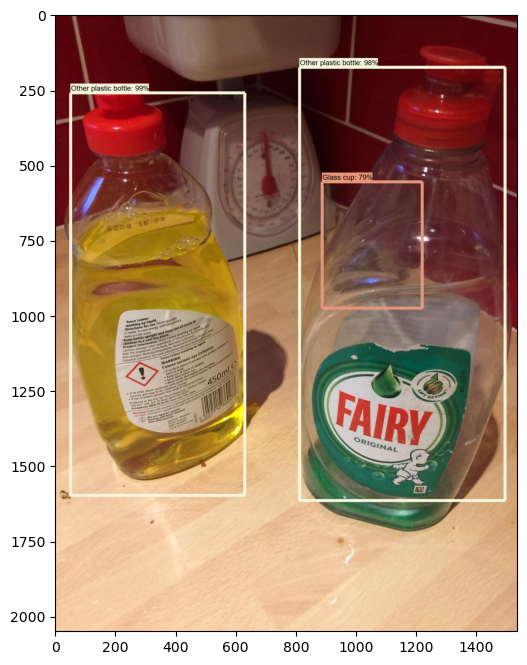

In [40]:
detect(detection_graph, 'taco/data/batch_1/000035.jpg')

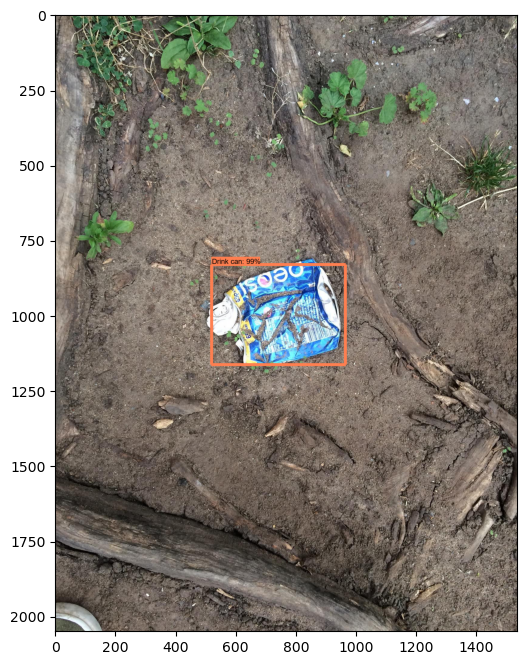

In [41]:
detect(detection_graph, 'taco/data/batch_1/000032.jpg')

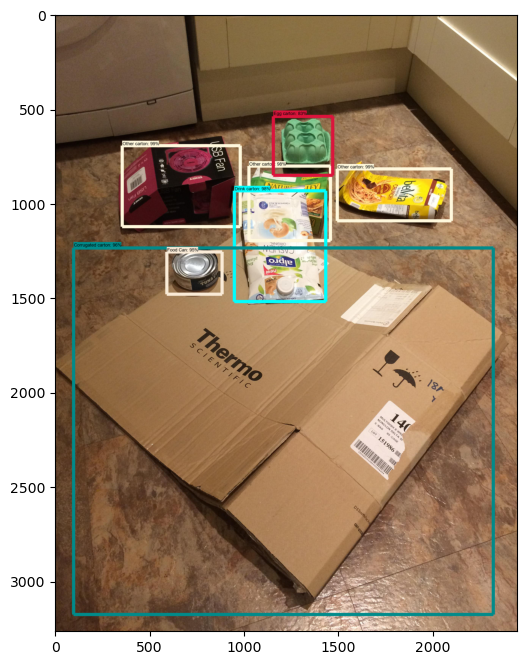

In [44]:
detect(detection_graph, 'taco/data/batch_1/000129.JPG')

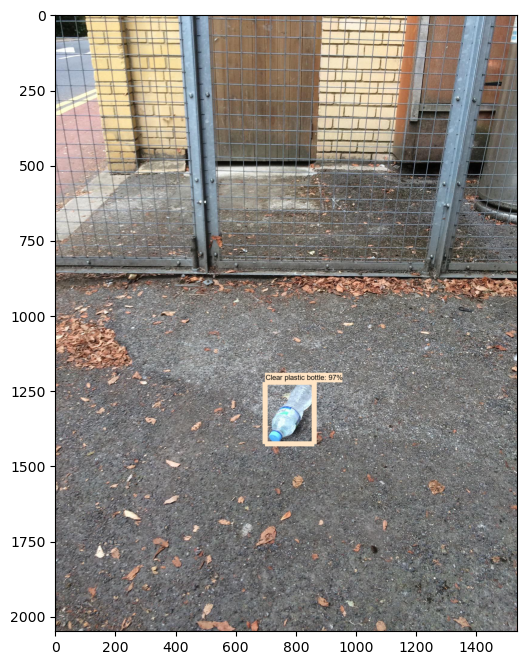

In [45]:
detect(detection_graph, 'taco/data/batch_1/000000.jpg')

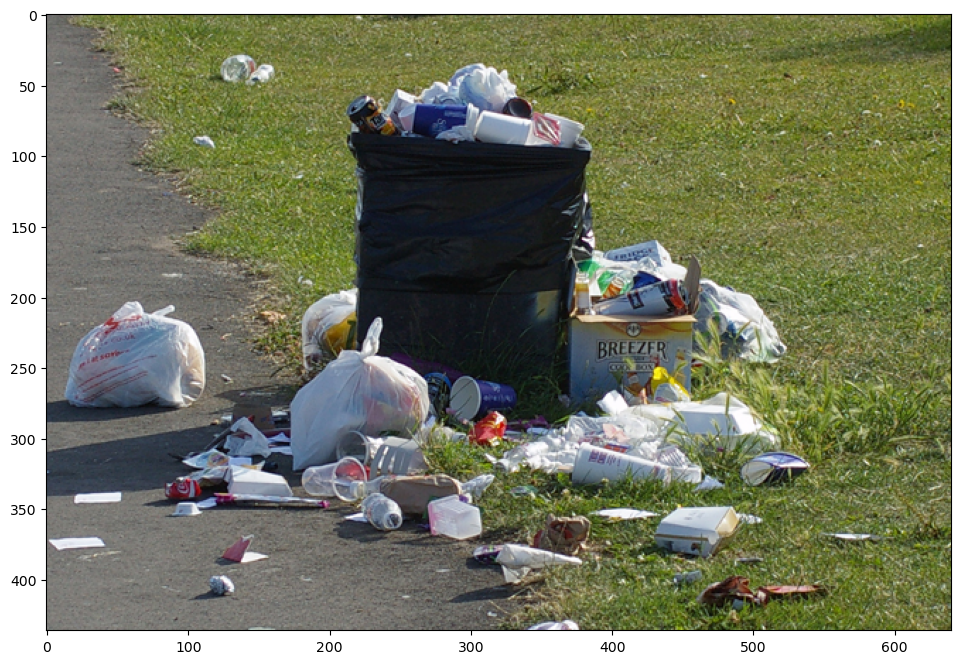

In [47]:
detect(detection_graph, 'data/001.jpg')

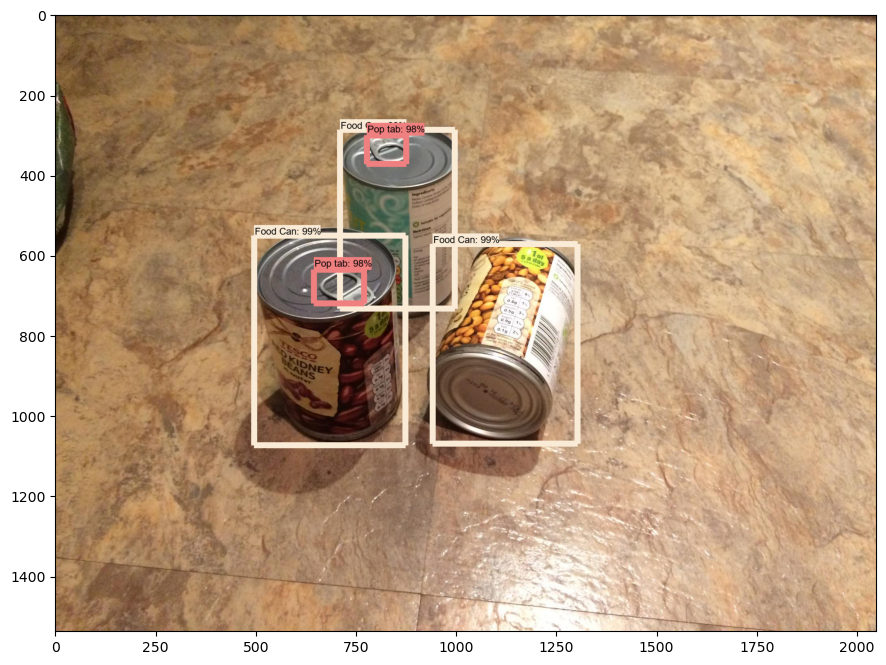

In [48]:
detect(detection_graph, 'taco/data/batch_1/000037.jpg')

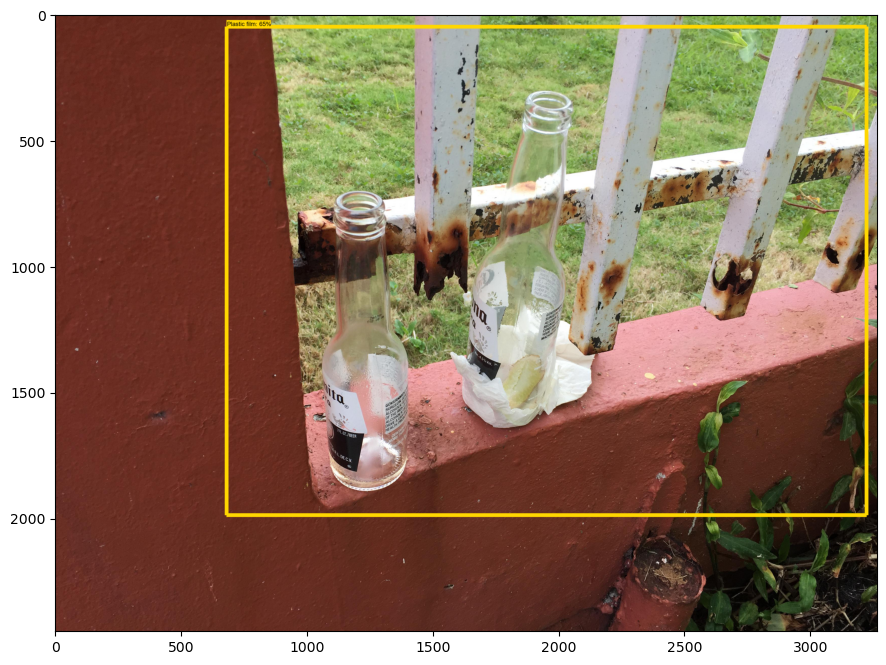

In [49]:
detect(detection_graph, 'taco/data/batch_15/000084.jpg')

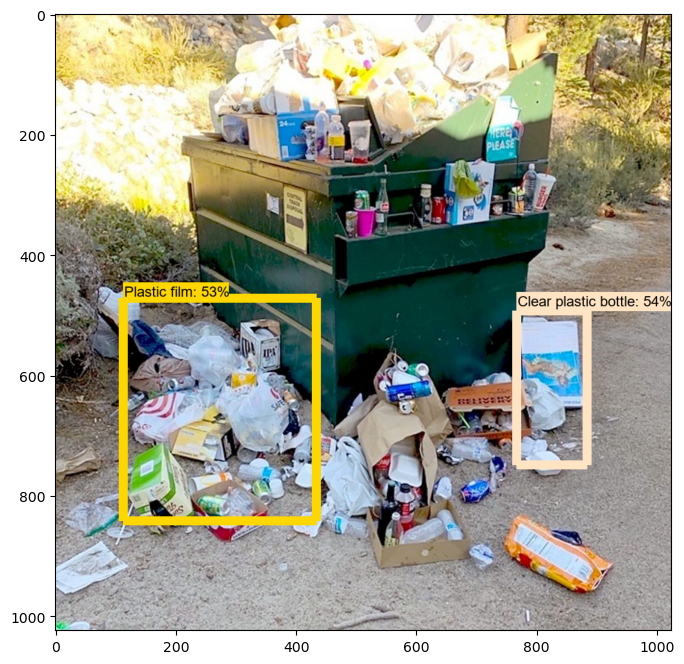

In [51]:
detect(detection_graph, 'img/001.jpg')

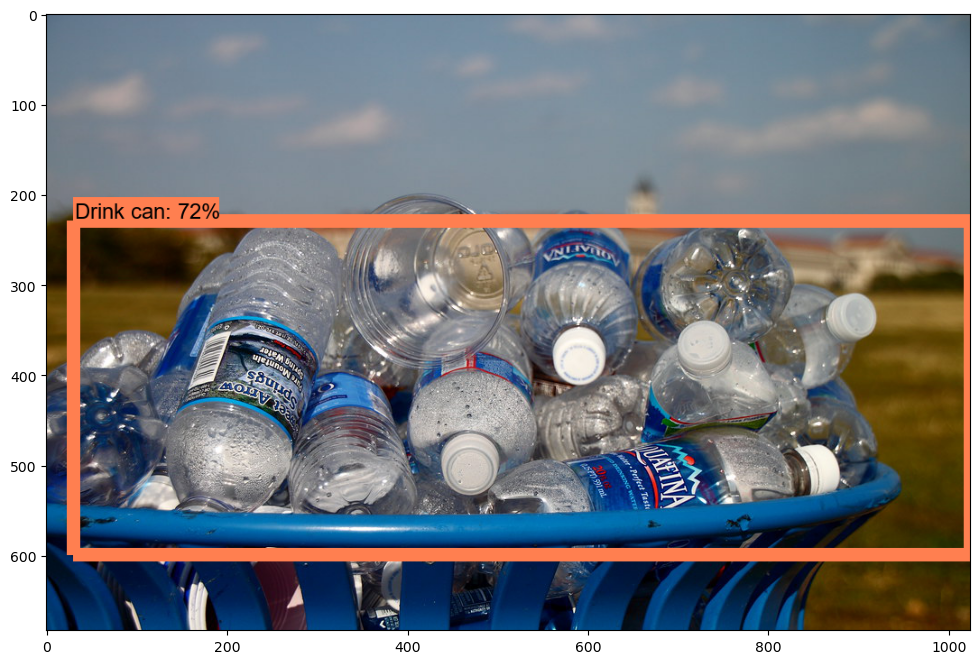

In [53]:
detect(detection_graph, 'img/003.jpg')

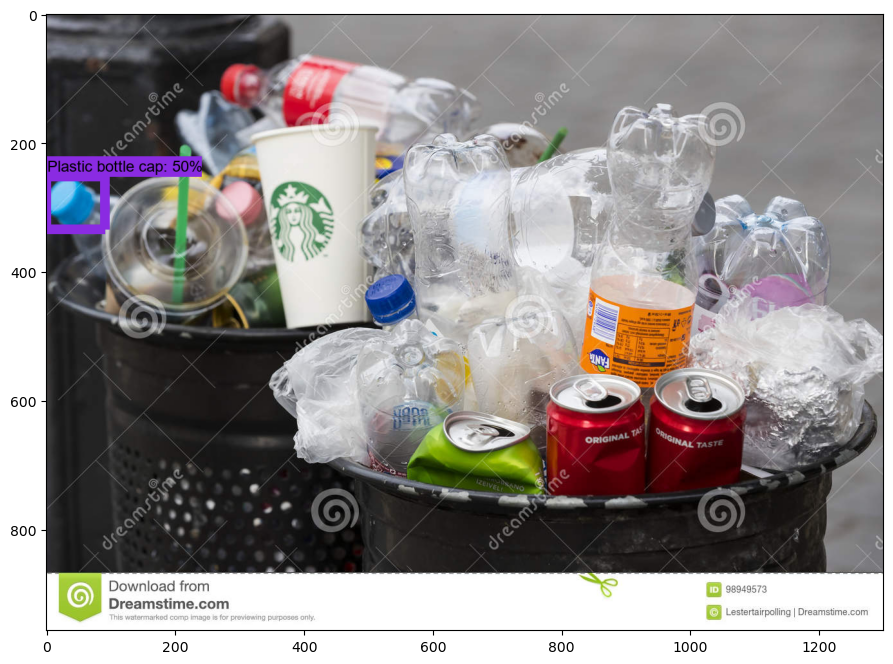

In [54]:
detect(detection_graph, 'img/004.jpg')

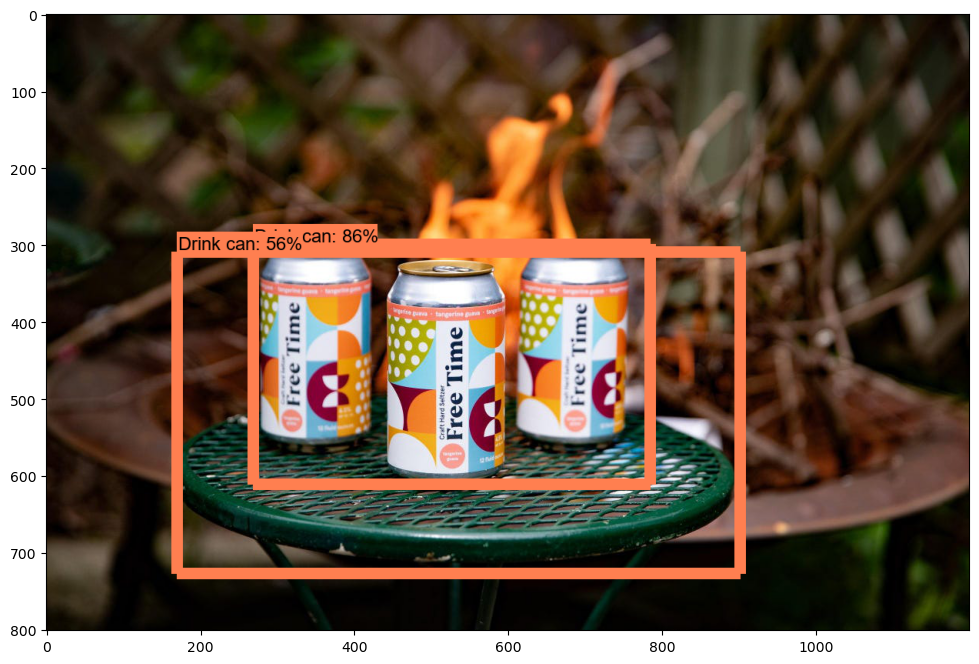

In [55]:
detect(detection_graph, 'img/005.jpg')

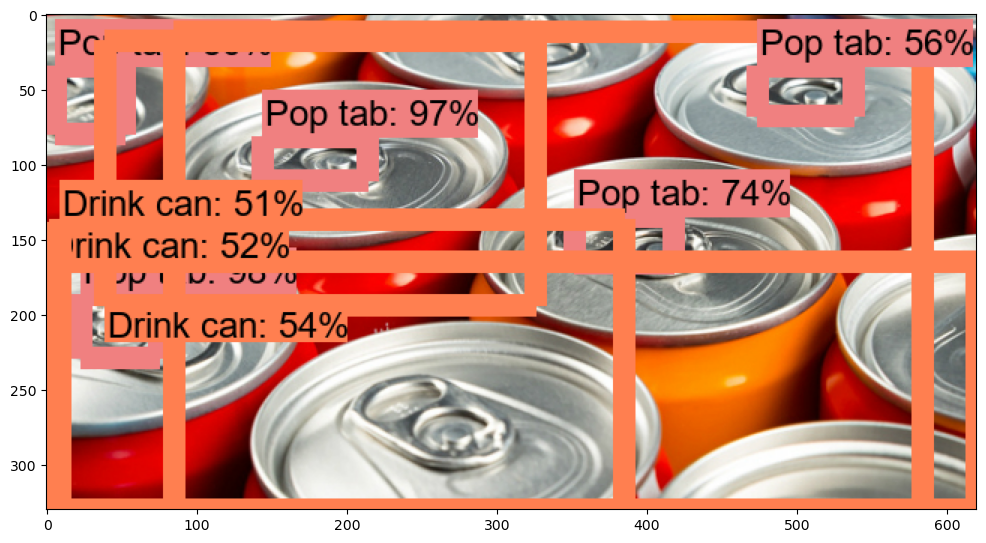

In [56]:
detect(detection_graph, 'img/006.jpg')

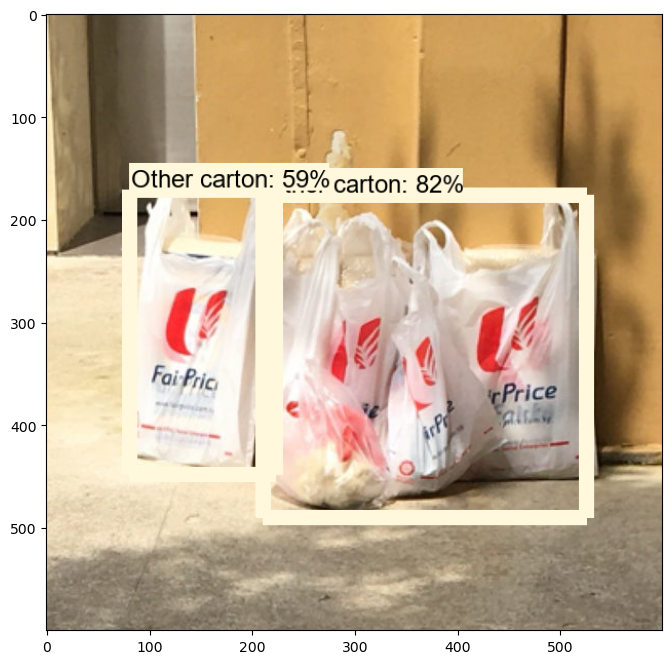

In [57]:
detect(detection_graph, 'img/007.jpg')

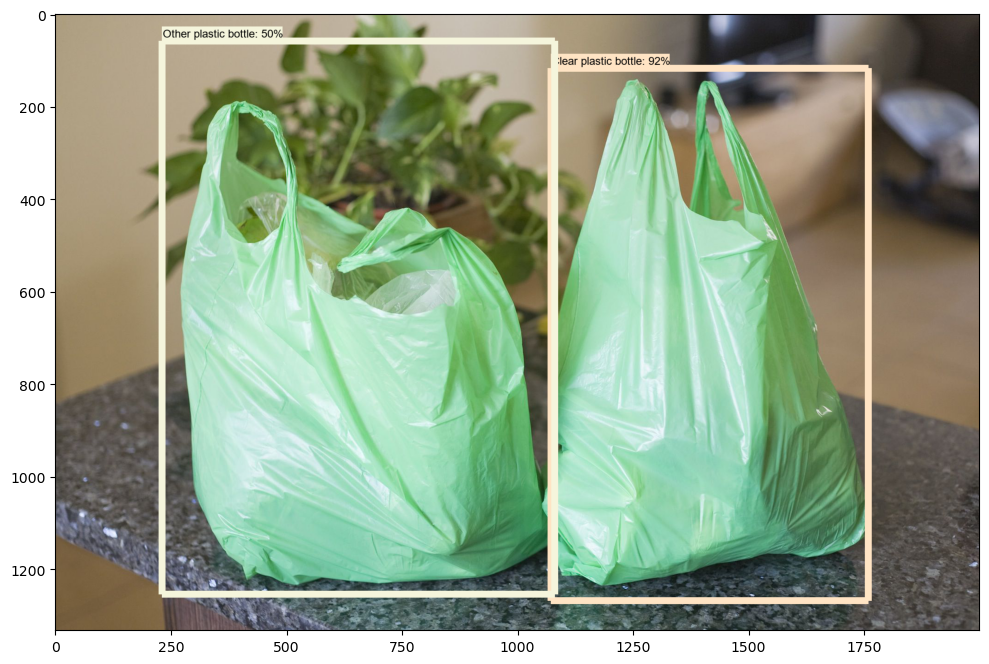

In [59]:
detect(detection_graph, 'img/008.jpg')

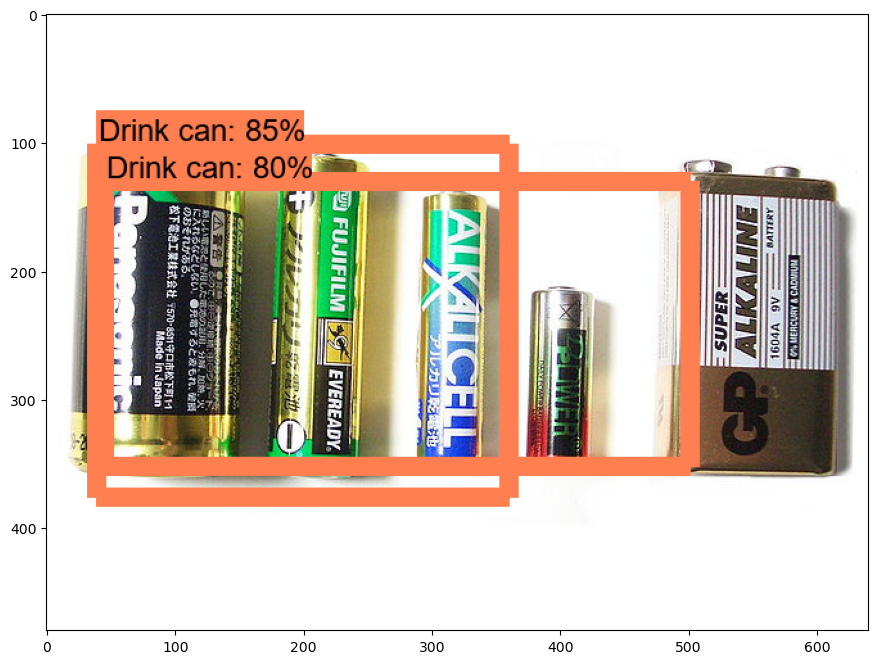

In [61]:
detect(detection_graph, 'img/009.jpg')

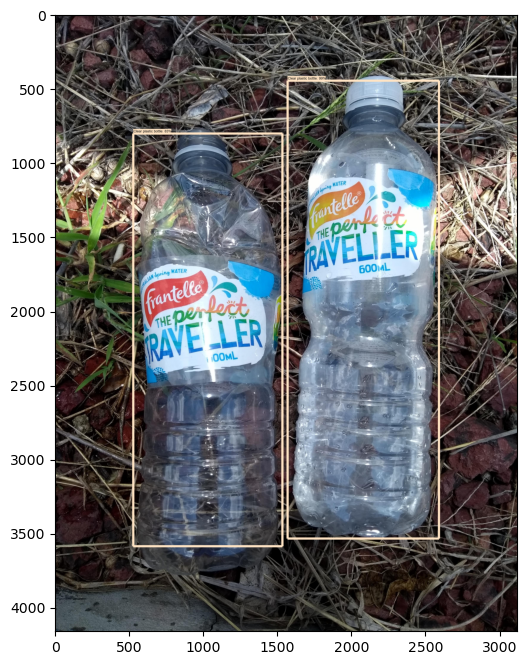

In [64]:
detect(detection_graph, 'taco/data/batch_13/000095.jpg')

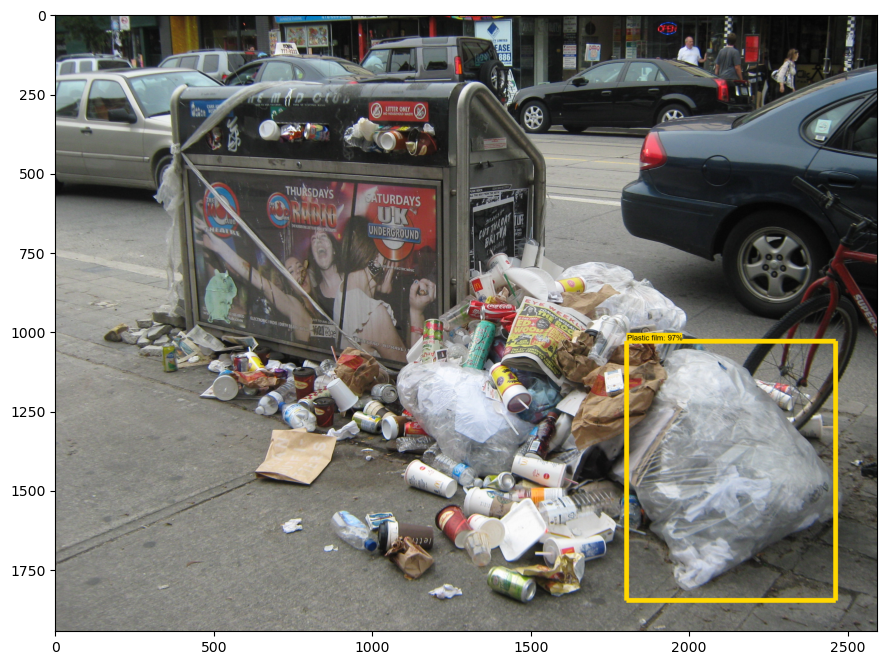

In [65]:
detect(detection_graph, 'img/0d61b8e2-6798-11e5-8c9e-40f2e96c8ad8.jpg')